# How to use this notebook

This notebook creates an augmented dataset and use it to train and finetune CovNextBase.

To use it run the cells under:
- libraries
- drive mount (mount your drive)
- utilities
- load dataset (load the dataset, split train and validation, balance classes)
- augmentation pipeline (DO NOT RUN AUGMENTATION TESTING) (funcions used to augment the dataset)
- define your array of augmentation in a dedicated section (see Test Augmentation 1)
- run create augmented dataset
- run train classifier

# Libraries

## TensorFlow and Keras

In [ ]:
!pip install tensorflow==2.17.0 keras==3.4.1 keras-cv

import tensorflow as tf
import keras as tfk
from keras import layers as tfkl
import keras_cv as tfkcv
from keras_cv import layers as tfkcvl

print(tf.__version__)
print(tfk.__version__)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 40.0 MB/s eta 0:00:00
2.17.0
3.4.1


## Others

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
BATCH_SIZE = 32
DRIVE_PROJECT_PATH = '/content/drive/MyDrive/Università/ANN/'
SEED = 42

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

# Drive mount

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Utilities

In [ ]:
def visualize_dataset(dataset, num_samples=9):
    # Take a batch of augmented images and labels from the dataset
    image_batch, label_batch = next(iter(dataset.batch(num_samples))) # Batch size of 9 for visualization

    # Display 9 images from the batch
    plt.figure(figsize=(10, 10))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))  # Convert image to uint8 for display
        plt.title(int(label_batch[i].numpy()))  # Display label as title
        plt.axis("off")

    plt.show()

In [ ]:
def print_dataset_charateristics(dataset):
  # Print len and element shape of the datasets
  print(f'Dataset size: {len(dataset)}')

  print(f'Dataset element shape: {next(iter(dataset))[0].shape}')

  print(f'Dataset element label: {next(iter(dataset))[1].shape}')

# Load dataset

In [ ]:
from sklearn.utils import resample
from collections import Counter

def balance_data_oversample(images, labels):
    # Count the samples per class and determine the maximum class count
    # Convert labels to a 1D array to make it hashable
    labels = labels.ravel()  # Flatten the labels array
    class_counts = Counter(labels)
    max_count = max(class_counts.values())

    # Separate images and labels by class
    balanced_images = []
    balanced_labels = []

    for label in np.unique(labels):
        images_class = images[labels == label]

        # Oversample to match the maximum class count
        images_balanced = resample(images_class, replace=True, n_samples=max_count, random_state=0)

        # Collect balanced data
        balanced_images.append(images_balanced)
        balanced_labels.append([label] * len(images_balanced))

    # Concatenate all balanced classes
    balanced_images = np.vstack(balanced_images)
    balanced_labels = np.concatenate(balanced_labels)

    print(f"Balanced dataset size: {balanced_images.shape[0]}")
    print(f"Class distribution after balancing: {Counter(balanced_labels)}")

    return balanced_images, balanced_labels

In [ ]:
# Import data
def load_data():
    data = np.load(DRIVE_PROJECT_PATH + 'training_set.npz')

    images = data['images']
    labels = data['labels']

    # Convert values in data to int
    images = images.astype(int)

    rick = 13571
    wtf = 11962

    rick  = np.array([np.array_equal(i, images[rick]) for i in images])
    wtf = np.array([np.array_equal(i, images[wtf]) for i in images])

    # Finding label to remove
    to_remove = wtf + rick

    print(f"Size before removing outliers: {images.shape[0]}")

    # Removing outliers
    to_keep = ~ to_remove

    images_cleaned = images[to_keep]
    labels_cleaned = labels[to_keep]

    print(f"Size after removing outliers: {images_cleaned.shape[0]}")

    # Remove doubles
    unique_images, idx_unique = np.unique(images_cleaned, return_index= True, axis=0)

    print(f"Size before removing doubles: {images_cleaned.shape[0]}")

    labels_cleaned = labels_cleaned[idx_unique]
    images_cleaned = images_cleaned[idx_unique]
    count = len(images_cleaned)
    labels_unique = np.unique(labels_cleaned)


    print(labels_unique)
    print(f"Size after removing doubles: {count}")

    return images_cleaned, labels_cleaned

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Load dataset
images, labels = load_data()

# create a tensor slices dataset
dataset = tf.data.Dataset.from_tensor_slices((images, labels))

print_dataset_charateristics(dataset)

# visualize dataset info
print(f'Images shape: {images.shape}')
print(f'Labels shape: {labels.shape}')
print(f'Dataset size: {len(dataset)}')

# visualize_dataset(dataset)

Size before removing outliers: 13759
Size after removing outliers: 11959
Size before removing doubles: 11959
[0 1 2 3 4 5 6 7]
Size after removing doubles: 11951
Dataset size: 11951
Dataset element shape: (96, 96, 3)
Dataset element label: (1,)
Images shape: (11951, 96, 96, 3)
Labels shape: (11951, 1)
Dataset size: 11951


In [ ]:
# print range of pixel values
print(f'Min pixel value: {np.min(images)}')
print(f'Max pixel value: {np.max(images)}')

Min pixel value: 0
Max pixel value: 255


## Train Validation split and class rebalancing through oversampling

In [ ]:
# Split the dataset into train and validation
X_train, X_val, y_train, y_val = train_test_split(images, labels, random_state=SEED,
                                                  test_size=0.2, stratify=np.argmax(labels,axis=1),
                                                  shuffle=True)         # Remember to shuffle!


# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

X_train shape: (9560, 96, 96, 3), y_train shape: (9560, 1)
X_val shape: (2391, 96, 96, 3), y_val shape: (2391, 1)


In [ ]:
X_train, y_train = balance_data_oversample(X_train, y_train)

# Print shapes of the datasets
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

Balanced dataset size: 14848
Class distribution after balancing: Counter({0: 1856, 1: 1856, 2: 1856, 3: 1856, 4: 1856, 5: 1856, 6: 1856, 7: 1856})
X_train shape: (14848, 96, 96, 3), y_train shape: (14848,)
X_val shape: (2391, 96, 96, 3), y_val shape: (2391, 1)


In [ ]:
from sklearn.preprocessing import LabelEncoder

def encode_labels(labels):
  # one-hot encoding labeling
  label_encoder = LabelEncoder()
  # This converts to a vector of 0s and 1s
  labels_enc = label_encoder.fit_transform(labels)
  # This creates the one-hot encoding
  return tfk.utils.to_categorical(labels_enc)

In [ ]:
y_train = encode_labels(y_train)
y_val = encode_labels(y_val)

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")

X_train shape: (14848, 96, 96, 3), y_train shape: (14848, 8)
X_val shape: (2391, 96, 96, 3), y_val shape: (2391, 8)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
training_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
# Shuffle training dataset
training_dataset = training_dataset.shuffle(buffer_size=len(training_dataset), seed=SEED)

validation_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))

In [ ]:
print_dataset_charateristics(training_dataset)

Dataset size: 14848
Dataset element shape: (96, 96, 3)
Dataset element label: (1,)


In [ ]:
print_dataset_charateristics(validation_dataset)

Dataset size: 2391
Dataset element shape: (96, 96, 3)
Dataset element label: (1,)


<ipython-input-5-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


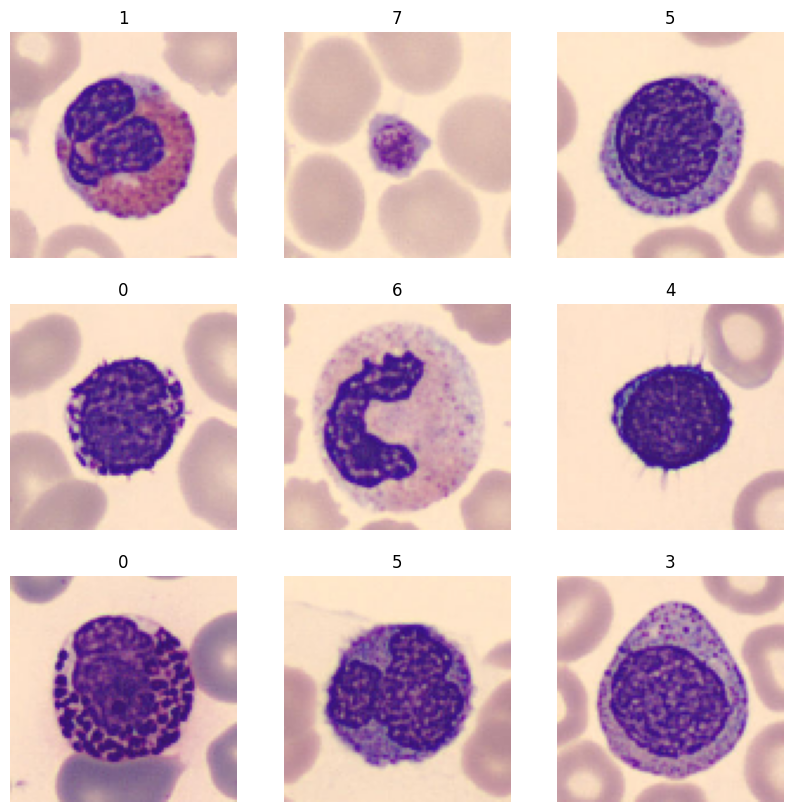

In [ ]:
# Visualize one image - label pair for training and validation
visualize_dataset(training_dataset)

<ipython-input-5-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


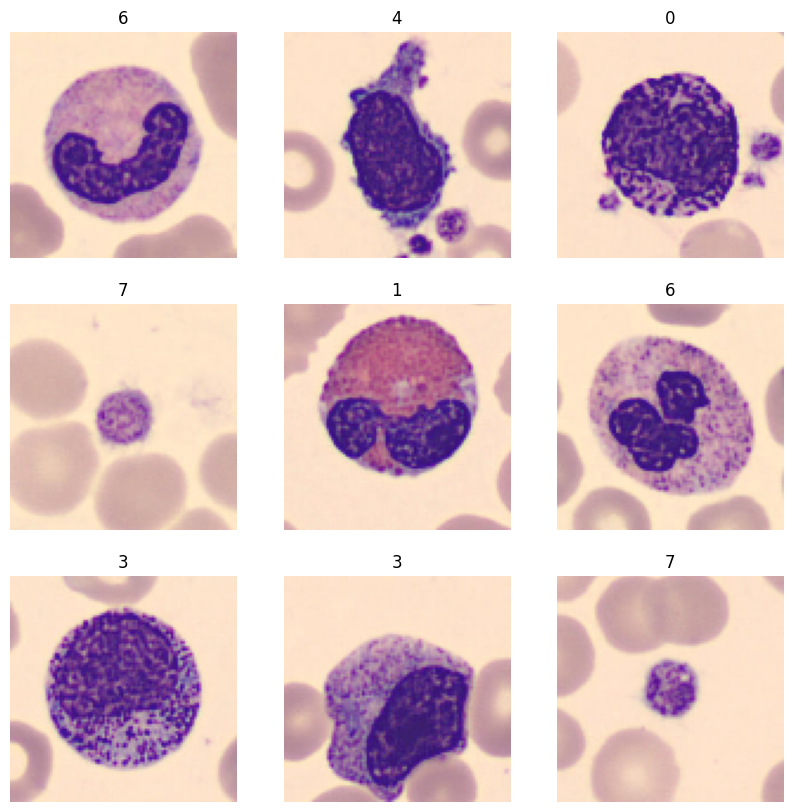

In [ ]:
visualize_dataset(validation_dataset)

# Augmentation testing

## Test CutMix

In [ ]:
cutMixLayer = tfkcvl.CutMix()

def applyCutMixAndMixUp(images, labels): # modified to accept two arguments: image and label
  # create a dictionary with the image and label
  data = {'images': images, 'labels': labels}
  # cast labels to float32
  data['labels'] = tf.cast(data['labels'], tf.float32)
  data = cutMixLayer(data, training=True)
  # return the modified image and label
  return data['images'], data['labels']

In [ ]:
cutMixDataset = dataset.batch(BATCH_SIZE).map(applyCutMixAndMixUp, num_parallel_calls=AUTOTUNE)

In [ ]:
# extract the images from the batches to obtain a full dataset
cutMixDataset = cutMixDataset.unbatch()

In [ ]:
print_dataset_charateristics(cutMixDataset)

TypeError: The dataset length is unknown.

<ipython-input-5-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


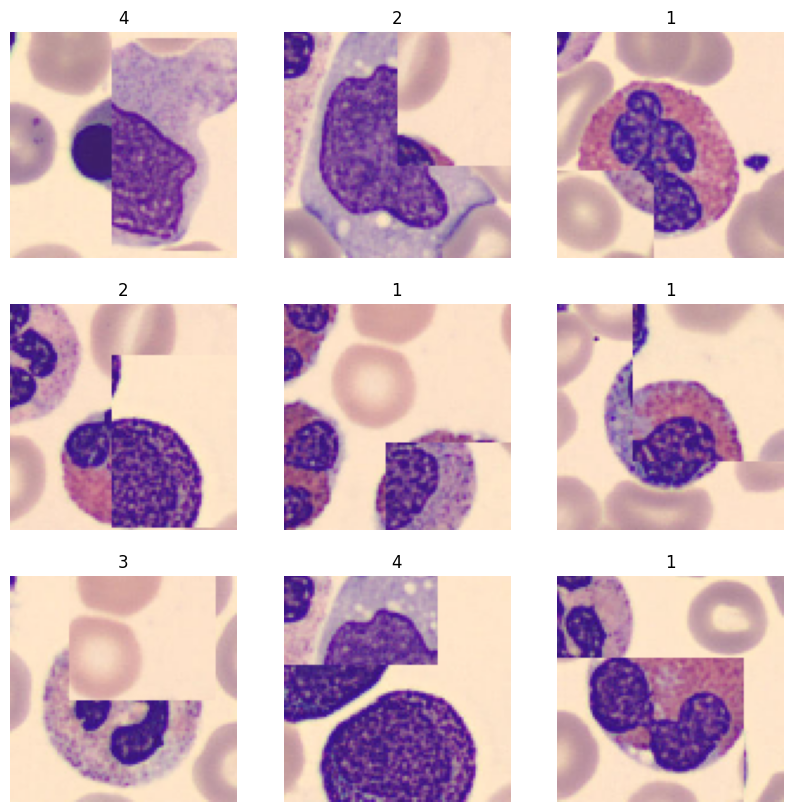

In [ ]:
visualize_dataset(cutMixDataset)

In [ ]:
del cutMixDataset
del cutMixLayer

## Test MixUp

In [ ]:
mixUpLayer = tfkcvl.MixUp()

def applyCutMixAndMixUp(images, labels): # modified to accept two arguments: image and label
  # create a dictionary with the image and label
  data = {'images': images, 'labels': labels}
  # cast labels to float32
  data['labels'] = tf.cast(data['labels'], tf.float32)
  data = mixUpLayer(data, training=True) # typo fixed: training instead of trainint
  # return the modified image and label
  return data['images'], data['labels']

In [ ]:
mixUpDataset = dataset.batch(BATCH_SIZE).map(applyCutMixAndMixUp, num_parallel_calls=AUTOTUNE)

In [ ]:
# extract the images from the batches to obtain a full dataset
mixUpDataset = mixUpDataset.unbatch()

<ipython-input-6-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


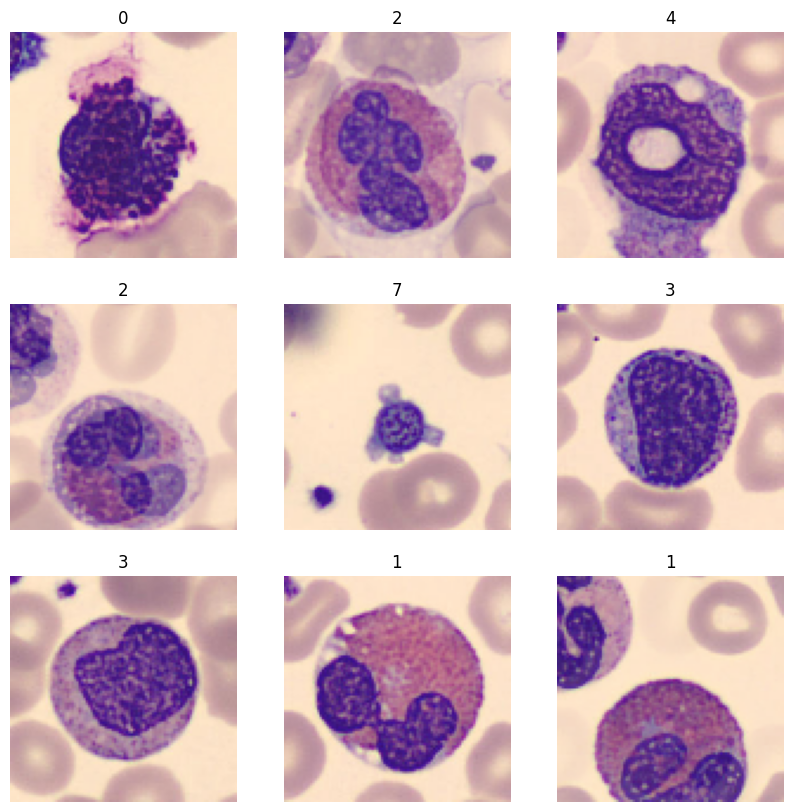

In [ ]:
visualize_dataset(mixUpDataset)

## Test RandAugment

In [ ]:
randAugmentLayer = tfkcvl.RandAugment(value_range=[0, 255])

def applyRandAugment(images, labels):
  return randAugmentLayer(images, training=True), labels

In [ ]:
# visualize layers of rangAugmentLayer
randAugmentLayer.layers

[<AutoContrast name=auto_contrast, built=True>,
 <Equalization name=equalization, built=True>,
 <Solarization name=solarization, built=True>,
 <RandomColorDegeneration name=random_color_degeneration, built=True>,
 <RandomContrast name=random_contrast, built=True>,
 <RandomBrightness name=random_brightness, built=True>,
 <RandomShear name=random_shear, built=True>,
 <RandomShear name=random_shear_1, built=True>,
 <RandomTranslation name=random_translation, built=True>,
 <RandomTranslation name=random_translation_1, built=True>]

In [ ]:
randAugmentedDataset = dataset.map(applyRandAugment, num_parallel_calls=AUTOTUNE)

<ipython-input-56-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


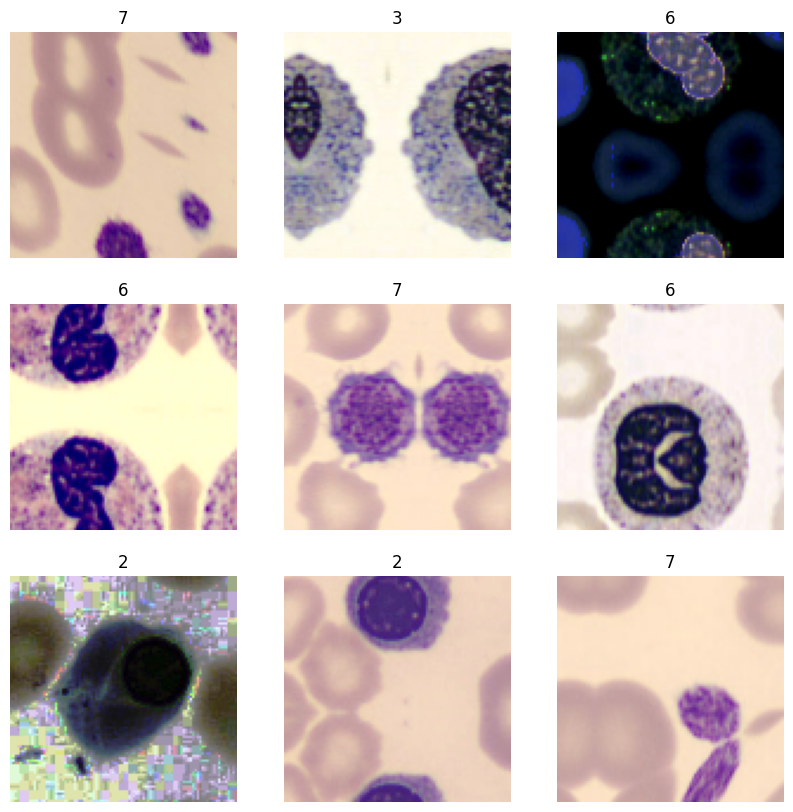

In [ ]:
visualize_dataset(randAugmentedDataset)

## Test Jittered

In [ ]:
jitteredLayer = tfkcvl.JitteredResize((96,96),(0.8, 1.25),(96,96),"xywh","bilinear")

def applyJittered(images, labels):
  return jitteredLayer(images, training=True), labels

In [ ]:
jitteredDataset = dataset.map(applyJittered, num_parallel_calls=AUTOTUNE)

<ipython-input-56-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


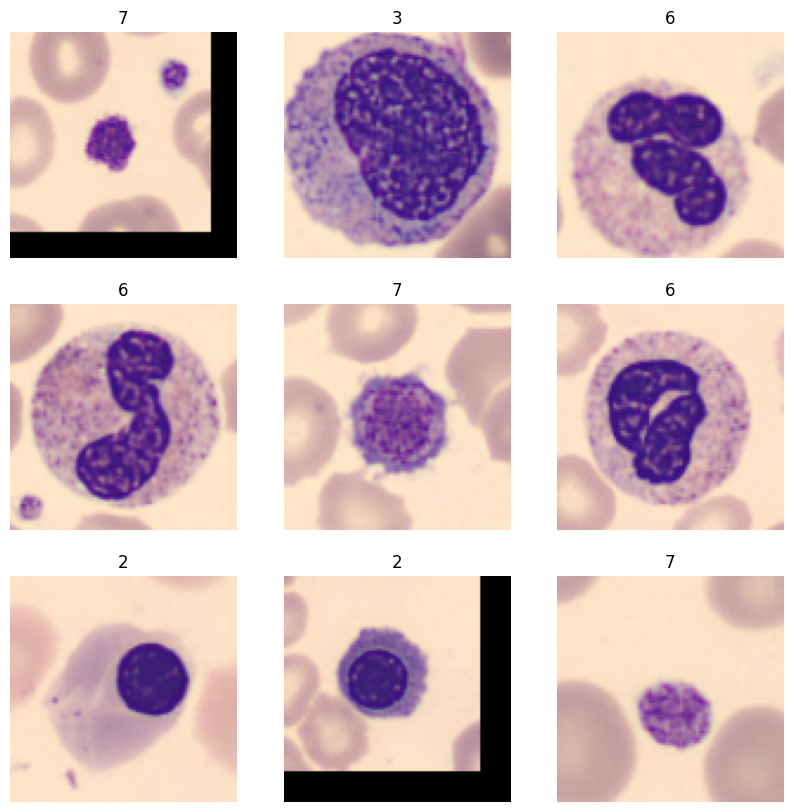

In [ ]:
visualize_dataset(jitteredDataset)

## Test GaussianNoise

In [ ]:
gaussianNoiseLayer = tfkl.GaussianNoise(1)

def applyGaussianNoise(images, labels):
  # cast images to float32
  images = tf.cast(images, tf.float32)
  return gaussianNoiseLayer(images, training=True), labels

In [ ]:
gaussianNoiseDataset = dataset.map(applyGaussianNoise, num_parallel_calls=AUTOTUNE)

<ipython-input-56-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


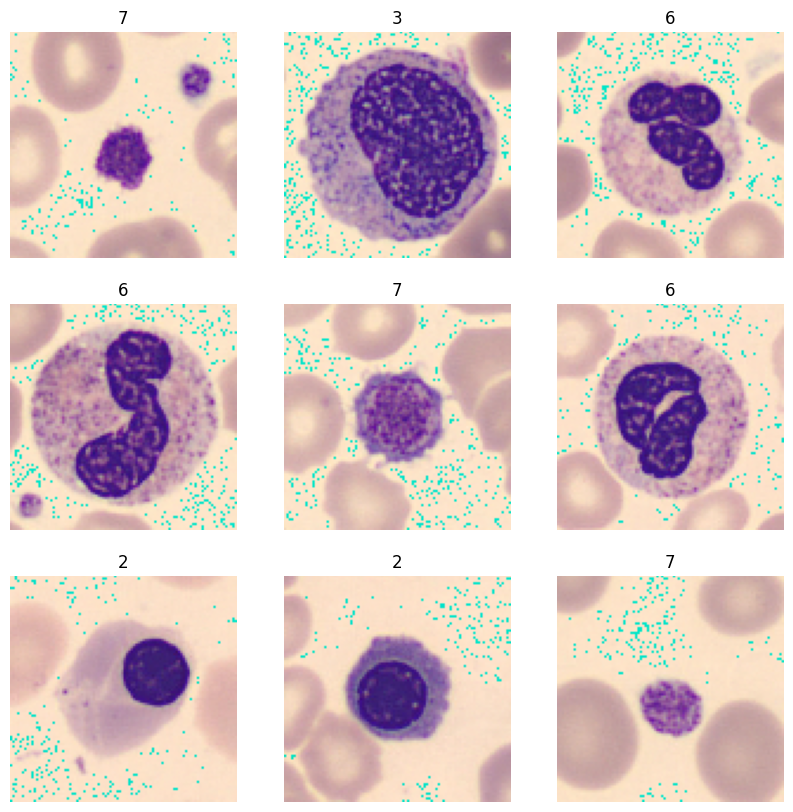

In [ ]:
visualize_dataset(gaussianNoiseDataset)

## Test Channel shuffle

In [ ]:
channelShuffleLayer = tfkcvl.ChannelShuffle()

def applyChannelShuffle(images, labels):
  return channelShuffleLayer(images, training=True), labels

In [ ]:
channelShuffleDataset = dataset.map(applyChannelShuffle, num_parallel_calls=AUTOTUNE)

<ipython-input-56-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


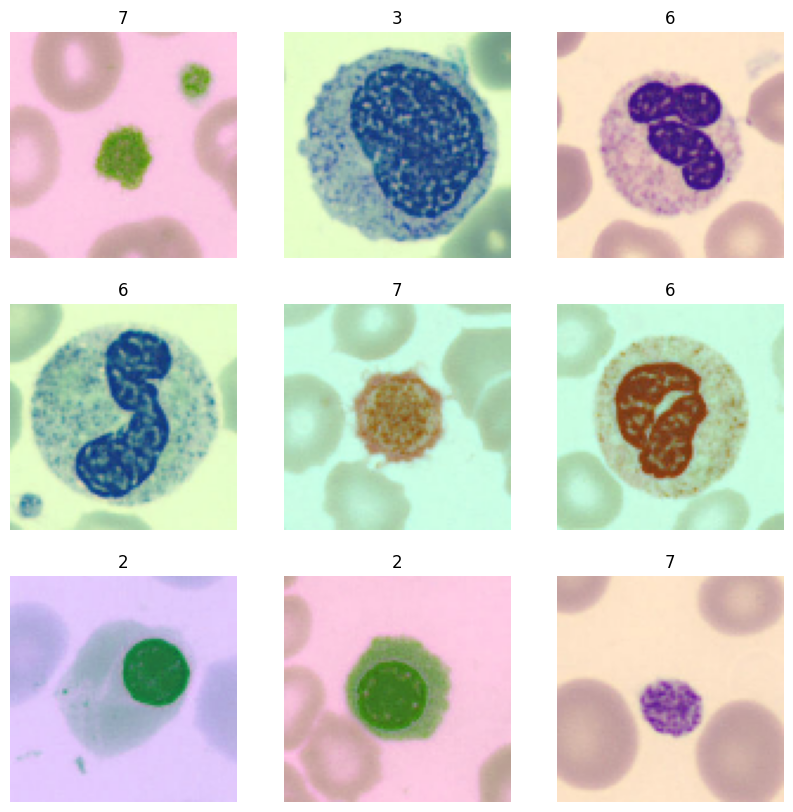

In [ ]:
visualize_dataset(channelShuffleDataset)

## Test GridMask

In [ ]:
gridMaskLayer = tfkcvl.GridMask()

def applyGridMask(images, labels):
  return gridMaskLayer(images, training=True), labels

In [ ]:
gridMaskDataset = dataset.map(applyGridMask, num_parallel_calls=AUTOTUNE)

<ipython-input-6-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


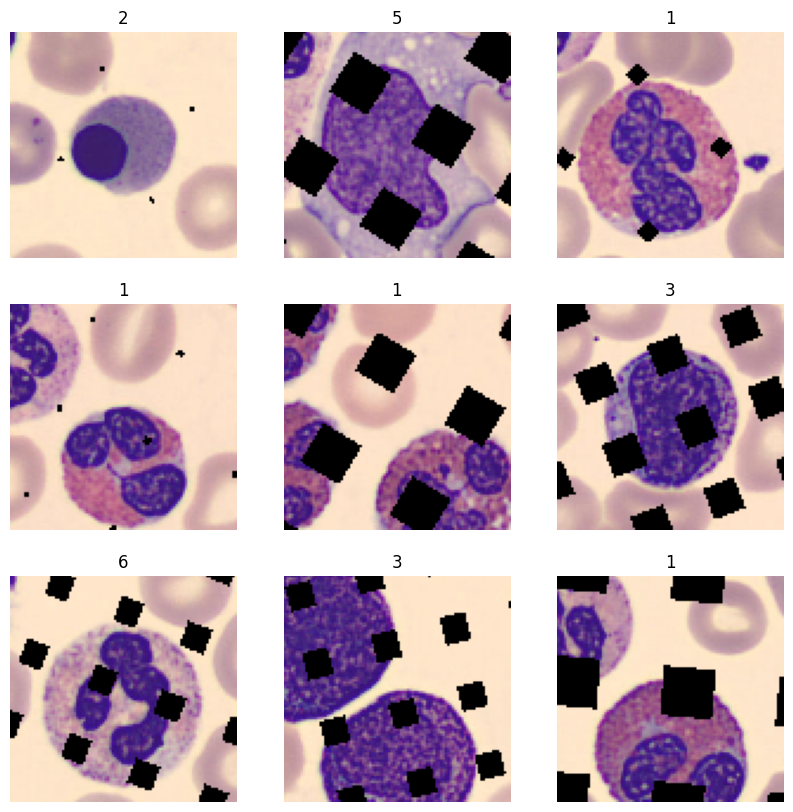

In [ ]:
visualize_dataset(gridMaskDataset)

# Augmentation pipeline

## Augmentation layers and functions

In [ ]:
# Possible augmentation steps

# CUTMIX
cutMixLayer = tfkcvl.CutMix()

def applyCutMixAndMixUp(images, labels): # modified to accept two arguments: image and label
  # create a dictionary with the image and label
  data = {'images': images, 'labels': labels}
  # cast labels to float32
  data['labels'] = tf.cast(data['labels'], tf.float32)
  data = cutMixLayer(data, training=True)
  # return the modified image and label
  return data['images'], data['labels']

# MIXUP
mixUpLayer = tfkcvl.MixUp()

def applyCutMixAndMixUp(images, labels): # modified to accept two arguments: image and label
  # create a dictionary with the image and label
  data = {'images': images, 'labels': labels}
  # cast labels to float32
  data['labels'] = tf.cast(data['labels'], tf.float32)
  data = mixUpLayer(data, training=True) # typo fixed: training instead of trainint
  # return the modified image and label
  return data['images'], data['labels']

# RANDAUGMENT
randAugmentLayer = tfkcvl.RandAugment(value_range=[0, 255])

def applyRandAugment(images, labels):
  return randAugmentLayer(images, training=True), labels

# JITTERED
jitteredLayer = tfkcvl.JitteredResize((96,96),(0.8, 1.25),(96,96),"xywh","bilinear")

def applyJittered(images, labels):
  return jitteredLayer(images, training=True), labels

# GAUSSIAN NOISE
gaussianNoiseLayer = tfkl.GaussianNoise(1)

def applyGaussianNoise(images, labels):
  # cast images to float32
  images = tf.cast(images, tf.float32)
  return gaussianNoiseLayer(images, training=True), labels

# CHANNEL SHUFFLE
channelShuffleLayer = tfkcvl.ChannelShuffle()

def applyChannelShuffle(images, labels):
  return channelShuffleLayer(images, training=True), labels

# GRIDMASK
gridMaskLayer = tfkcvl.GridMask()

def applyGridMask(images, labels):
  return gridMaskLayer(images, training=True), labels

## Augmentation dictionary

In [ ]:
# AUGMENTATIONS DICTIONARY
augmentation_steps = {
    'cutmix': {
        'apply': applyCutMixAndMixUp,
        'need_batch': True
    },
    'mixup': {
        'apply': applyCutMixAndMixUp,
        'need_batch': True
    },
    'randaugment': {
        'apply': applyRandAugment,
        'need_batch': False
    },
    'jittered': {
        'apply': applyJittered,
        'need_batch': False
    },
    'gaussiannoise': {
        'apply': applyGaussianNoise,
        'need_batch': False
    },
    'channelshuffle': {
        'apply': applyChannelShuffle,
        'need_batch': False
    },
    'gridmask': {
        'apply': applyGridMask,
        'need_batch': False
    }
}

## Augmented dataset creation function


In [ ]:
# Function that given the training set and a list of augmentation names apply sequentially the requested augmentations
def create_augmented_dataset(dataset, augmentations):
  augmented_dataset = dataset

  for augmentation in augmentations:
    if augmentation_steps[augmentation]['need_batch']:
      augmented_dataset = augmented_dataset.batch(BATCH_SIZE).map(augmentation_steps[augmentation]['apply'], num_parallel_calls=AUTOTUNE)
      augmented_dataset = augmented_dataset.unbatch()
    else:
      augmented_dataset = augmented_dataset.map(augmentation_steps[augmentation]['apply'], num_parallel_calls=AUTOTUNE)

  return augmented_dataset

# Test augmentation 1 - MixUp, CutMix, RandAugment

In [ ]:
augmentations = ['mixup', 'cutmix', 'randaugment']

# Create augmented dataset

In [ ]:
augmented_dataset = create_augmented_dataset(training_dataset, augmentations)

In [ ]:
print(f'Dataset element shape: {next(iter(augmented_dataset))[0].shape}')

print(f'Dataset element label: {next(iter(augmented_dataset))[1].shape}')

Dataset element shape: (96, 96, 3)
Dataset element label: (8,)


<ipython-input-5-9b7cbaca40d3>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(int(label_batch[i].numpy()))  # Display label as title


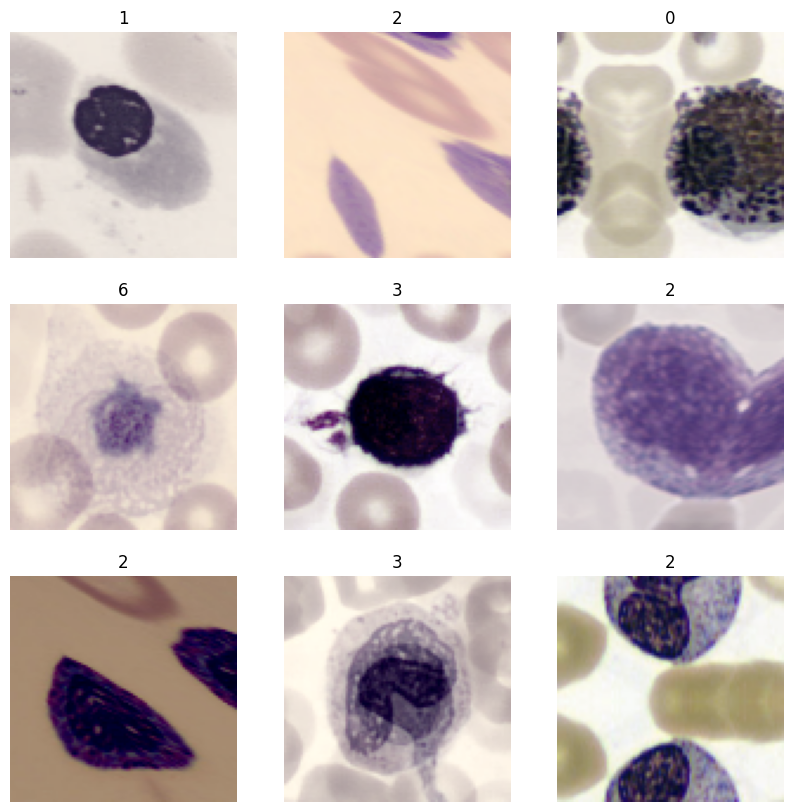

In [ ]:
visualize_dataset(augmented_dataset)

# Train Classifier


In [ ]:
from keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

In [ ]:
# Extract images and labels from the modified dataset
augmented_images = []
augmented_labels = []

for img, lbl in augmented_dataset:
    augmented_images.append(img.numpy())  # Convert to numpy array
    augmented_labels.append(lbl.numpy())  # Convert to numpy array

# Convert lists to NumPy arrays
augmented_images_array = np.array(augmented_images)
augmented_labels_array = np.array(augmented_labels)

# Print the shapes of the arrays
print("Augmented Images Shape:", augmented_images_array.shape)
print("Augmented Labels Shape:", augmented_labels_array.shape)

In [ ]:
# Input shape for the model
input_shape = augmented_images_array.shape[1:]

# Output shape for the model
output_shape = augmented_labels_array.shape[-1]

print(input_shape)
print(output_shape)

(96, 96, 3)
8
Dataset element shape: (96, 96, 3)
Dataset element label: [0.06852889 0.         0.         0.5087583  0.05438709 0.
 0.3683257  0.        ]


Model: "convnext_base"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15            │ (None, 96, 96, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_prestem_no… │ (None, 96, 96, 3)      │              0 │ input_layer_15[0][0]   │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stem        │ (None, 24, 24, 128)    │          6,528 │ convnext_base_prestem… │
│ (Sequential)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 24, 24, 128)    │          6,272 │ -                      │
│ convnext_base_stem_conv   │                        │                │                        │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│    └                      │ (None, 24, 24, 128)    │            256 │ -                      │
│ convnext_base_stem_layer… │                        │                │                        │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 128)    │          6,400 │ convnext_base_stem[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 128)    │            256 │ convnext_base_stage_0… │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 512)    │         66,048 │ convnext_base_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 512)    │              0 │ convnext_base_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 128)    │         65,664 │ convnext_base_stage_0… │
│ (Dense)                   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 128)    │            128 │ convnext_base_stage_0… │
│ (LayerScale)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ convnext_base_stage_0_bl… │ (None, 24, 24, 128)    │              0 │ convnext_base_stage_0… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_108 (Add)        

 Total params: 87,566,464 (334.04 MB)

 Trainable params: 87,566,464 (334.04 MB)

 Non-trainable params: 0 (0.00 B)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.949603 to fit



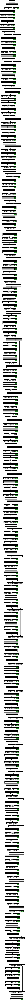

In [ ]:
model = tfk.applications.ConvNeXtBase(
    include_top=False,
    include_preprocessing=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=input_shape,
    pooling='avg',
    classes=1000,
    classifier_activation="softmax",
    name="convnext_base",
)
# Display a summary of the model architecture
model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

## Training with freezed model

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ convnext_base (Functional)           │ (None, 1024)                │      87,566,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_15 (InputLayer)     │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 96, 96, 3)           │               0 │
│ convnext_base_prestem_normalization  │                             │                 │
│ (Normalization)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ convnext_base_stem (Sequential) │ (None, 24, 24, 128)         │           6,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│       └ convnext_base_stem_conv      │ (None, 24, 24, 128)         │           6,272 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│       └ convnext_base_stem_layernorm │ (None, 24, 24, 128)         │             256 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │           6,400 │
│ convnext_base_stage_0_block_0_depth… │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │             256 │
│ convnext_base_stage_0_block_0_layer… │                             │                 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 512)         │          66,048 │
│ convnext_base_stage_0_block_0_point… │                             │                 │
│ (Dense)                              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 512)         │               0 │
│ convnext_base_stage_0_block_0_gelu   │                             │                 │
│ (Activation)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │          65,664 │
│ convnext_base_stage_0_block_0_point… │                             │                 │
│ (Dense)                              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │             128 │
│ convnext_base_stage_0_block_0_layer… │                             │                 │
│ (LayerScale)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 87,574,664 (334.07 MB)

 Trainable params: 8,200 (32.03 KB)

 Non-trainable params: 87,566,464 (334.04 MB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.939987 to fit



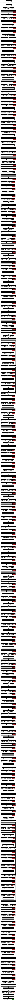

In [ ]:
# Freeze all layers in model to use it solely as a feature extractor
model.trainable = False

# Define input layer with shape matching the input images
inputs = tfk.Input(shape=input_shape, name='input_layer')

# Pass augmented inputs through the model feature extractor
x = model(inputs)

# Add a dropout layer for regularisation
x = tfkl.Dropout(0.2, name='dropout')(x)

# Add final Dense layer for classification with softmax activation
outputs = tfkl.Dense(output_shape, activation='softmax', name='dense')(x)

# Define the complete model linking input and output
tl_model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

# Compile the model with categorical cross-entropy loss and Adam optimiser
tl_model.compile(loss=tfk.losses.CategoricalCrossentropy(),
                 optimizer=tfk.optimizers.AdamW(learning_rate=1e-3),
                 metrics=['accuracy'])

# Display a summary of the model architecture
tl_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(tl_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Learning Rate scheduler
def lr_schedule(epoch, lr):
    if epoch < 40:
        return lr
    else:
        return lr * (1-0.01)


lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lr_schedule)

In [ ]:
# Train the model
tl_history = tl_model.fit(
    x=augmented_images_array,
    y=augmented_labels_array,
    batch_size=64,
    epochs=200,
    validation_data=(X_val, y_val),
    callbacks=[
        tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=10, restore_best_weights=True),
        lr_scheduler
        ]
).history

# Calculate and print the best validation accuracy achieved
final_val_accuracy = round(max(tl_history['val_accuracy']) * 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file, including final accuracy in the filename
model_filename = 'ConvBase.keras'
tl_model.save(model_filename)

# Free memory by deleting the model instance
del model
del tl_model

Epoch 1/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 51s 110ms/step - accuracy: 0.4279 - loss: 1.7847 - val_accuracy: 0.8841 - val_loss: 0.4854 - learning_rate: 0.0010
Epoch 2/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.6482 - loss: 1.2790 - val_accuracy: 0.9180 - val_loss: 0.4028 - learning_rate: 0.0010
Epoch 3/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.6999 - loss: 1.1738 - val_accuracy: 0.8963 - val_loss: 0.4091 - learning_rate: 0.0010
Epoch 4/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.7199 - loss: 1.1240 - val_accuracy: 0.9281 - val_loss: 0.3651 - learning_rate: 0.0010
Epoch 5/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7325 - loss: 1.1064 - val_accuracy: 0.9164 - val_loss: 0.3842 - learning_rate: 0.0010
Epoch 6/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.7266 - loss: 1.1041 - val_accuracy: 0.8967 - val_loss: 0.4245 - learning_rate: 0.0010
Epoch 7/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.

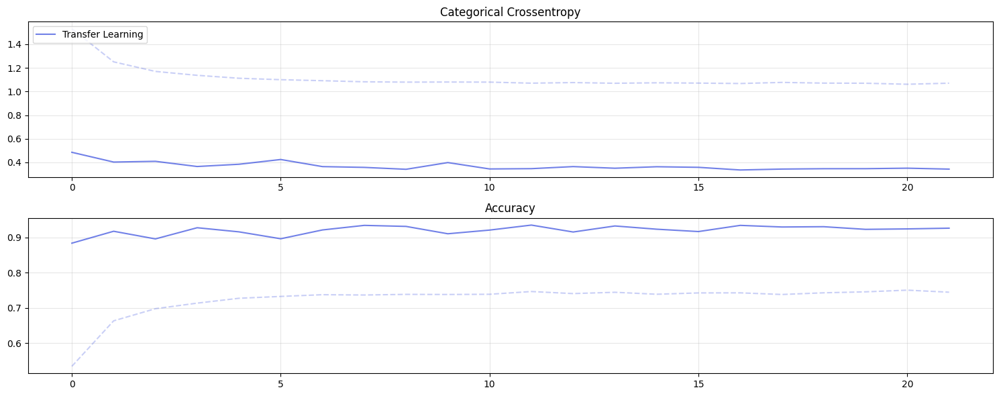

In [ ]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot loss for both re-trained and transfer learning models
ax1.plot(tl_history['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both re-trained and transfer learning models
ax2.plot(tl_history['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.set_title('Accuracy')
ax2.grid(alpha=0.3)

# Adjust layout to prevent label overlap and display the plots
plt.tight_layout()
plt.show()

## Fine Tuning

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ convnext_base (Functional)           │ (None, 1024)                │      87,566,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer_15 (InputLayer)     │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 96, 96, 3)           │               0 │
│ convnext_base_prestem_normalization  │                             │                 │
│ (Normalization)                      │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ convnext_base_stem (Sequential) │ (None, 24, 24, 128)         │           6,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│       └ convnext_base_stem_conv      │ (None, 24, 24, 128)         │           6,272 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│       └ convnext_base_stem_layernorm │ (None, 24, 24, 128)         │             256 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │           6,400 │
│ convnext_base_stage_0_block_0_depth… │                             │                 │
│ (Conv2D)                             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │             256 │
│ convnext_base_stage_0_block_0_layer… │                             │                 │
│ (LayerNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 512)         │          66,048 │
│ convnext_base_stage_0_block_0_point… │                             │                 │
│ (Dense)                              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 512)         │               0 │
│ convnext_base_stage_0_block_0_gelu   │                             │                 │
│ (Activation)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │          65,664 │
│ convnext_base_stage_0_block_0_point… │                             │                 │
│ (Dense)                              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └                                 │ (None, 24, 24, 128)         │             128 │
│ convnext_base_stage_0_block_0_layer… │                             │                 │
│ (LayerScale)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 87,591,066 (334.13 MB)

 Trainable params: 8,200 (32.03 KB)

 Non-trainable params: 87,566,464 (334.04 MB)

 Optimizer params: 16,402 (64.07 KB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.939987 to fit



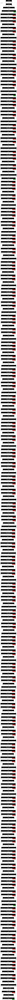

In [ ]:
# Re-load the model after transfer learning
ft_model = tfk.models.load_model('ConvBase.keras')

# Display a summary of the model architecture
ft_model.summary(expand_nested=True)

# Display model architecture with layer shapes and trainable parameters
tfk.utils.plot_model(ft_model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Set the MobileNetV3Small model layers as trainable
ft_model.get_layer('convnext_base').trainable = True

# Set all MobileNetV3Small layers as non-trainable
for layer in ft_model.get_layer('convnext_base').layers:
    layer.trainable = False

# Enable training only for Conv2D and DepthwiseConv2D layers
for i, layer in enumerate(ft_model.get_layer('convnext_base').layers):
    if isinstance(layer, tf.keras.layers.Conv2D) or isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        layer.trainable = True
        print(i, layer.name, type(layer).__name__, layer.trainable)

3 convnext_base_stage_0_block_0_depthwise_conv Conv2D True
10 convnext_base_stage_0_block_1_depthwise_conv Conv2D True
17 convnext_base_stage_0_block_2_depthwise_conv Conv2D True
25 convnext_base_stage_1_block_0_depthwise_conv Conv2D True
32 convnext_base_stage_1_block_1_depthwise_conv Conv2D True
39 convnext_base_stage_1_block_2_depthwise_conv Conv2D True
47 convnext_base_stage_2_block_0_depthwise_conv Conv2D True
54 convnext_base_stage_2_block_1_depthwise_conv Conv2D True
61 convnext_base_stage_2_block_2_depthwise_conv Conv2D True
68 convnext_base_stage_2_block_3_depthwise_conv Conv2D True
75 convnext_base_stage_2_block_4_depthwise_conv Conv2D True
82 convnext_base_stage_2_block_5_depthwise_conv Conv2D True
89 convnext_base_stage_2_block_6_depthwise_conv Conv2D True
96 convnext_base_stage_2_block_7_depthwise_conv Conv2D True
103 convnext_base_stage_2_block_8_depthwise_conv Conv2D True
110 convnext_base_stage_2_block_9_depthwise_conv Conv2D True
117 convnext_base_stage_2_block_10_dept

In [ ]:
# Compile the model
ft_model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.AdamW(1e-4),
                 metrics=['accuracy'])

In [ ]:
# Fine-tune the model
ft_history = ft_model.fit(
    x = X_train,
    y = y_train,
    batch_size = 64,
    epochs = 200,
    validation_data = (X_val, y_val),
    callbacks = [
        tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=10,
                                             restore_best_weights=True),
        lr_scheduler
        ]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(ft_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'ConvBase_ft'+str(final_val_accuracy)+'.keras'
ft_model.save(model_filename)

# Delete the model to free up resources
del ft_model

Epoch 1/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 70s 135ms/step - accuracy: 0.9492 - loss: 0.1758 - val_accuracy: 0.9753 - val_loss: 0.0795 - learning_rate: 1.0000e-04
Epoch 2/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.9913 - loss: 0.0376 - val_accuracy: 0.9787 - val_loss: 0.0661 - learning_rate: 1.0000e-04
Epoch 3/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.9978 - loss: 0.0147 - val_accuracy: 0.9808 - val_loss: 0.0621 - learning_rate: 1.0000e-04
Epoch 4/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - accuracy: 0.9989 - loss: 0.0073 - val_accuracy: 0.9803 - val_loss: 0.0607 - learning_rate: 1.0000e-04
Epoch 5/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - accuracy: 0.9998 - loss: 0.0033 - val_accuracy: 0.9803 - val_loss: 0.0618 - learning_rate: 1.0000e-04
Epoch 6/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 1.0000 - loss: 0.0021 - val_accuracy: 0.9816 - val_loss: 0.0626 - learning_rate: 1.0000e-04
Epoch 7/200
232/232 ━━━━━━━━━━━━━━━━━━━━ 23s 

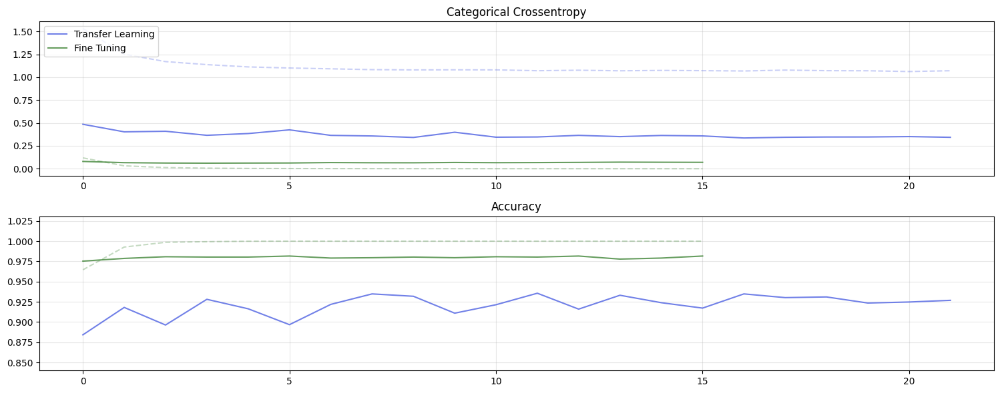

In [ ]:
# Create figure and subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 6))

# Plot categorical cross-entropy loss for both Transfer Learning and Fine Tuning stages
ax1.plot(tl_history['loss'], alpha=0.3, color='#4D61E2', linestyle='--')
ax1.plot(tl_history['val_loss'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax1.plot(ft_history['loss'], alpha=0.3, color='#408537', linestyle='--')
ax1.plot(ft_history['val_loss'], label='Fine Tuning', alpha=0.8, color='#408537')
ax1.set_title('Categorical Crossentropy')
ax1.legend(loc='upper left')
ax1.grid(alpha=0.3)

# Plot accuracy for both Transfer Learning and Fine Tuning stages
ax2.plot(tl_history['accuracy'], alpha=0.3, color='#4D61E2', linestyle='--')
ax2.plot(tl_history['val_accuracy'], label='Transfer Learning', alpha=0.8, color='#4D61E2')
ax2.plot(ft_history['accuracy'], alpha=0.3, color='#408537', linestyle='--')
ax2.plot(ft_history['val_accuracy'], label='Fine Tuning', alpha=0.8, color='#408537')
ax2.set_title('Accuracy')
ax2.set_ylim([min(tl_history['val_accuracy']) * 0.95, max(ft_history['val_accuracy']) * 1.05])
ax2.grid(alpha=0.3)

# Adjust layout to prevent overlap and display the plots
plt.tight_layout()
plt.show()